In [1]:
from matplotlib.image import imread
import numpy as np
import matplotlib.pyplot as plt
import cv2
import easyocr
import pytesseract
from PIL import Image
import pandas as pd

#### Use tow ways to insert image data 

In [32]:
me2  = imread("data\me\IMG_20211118_171323.jpg")

In [33]:
me1  = Image.open("data\me\IMG_20211118_171323.jpg").convert("L")

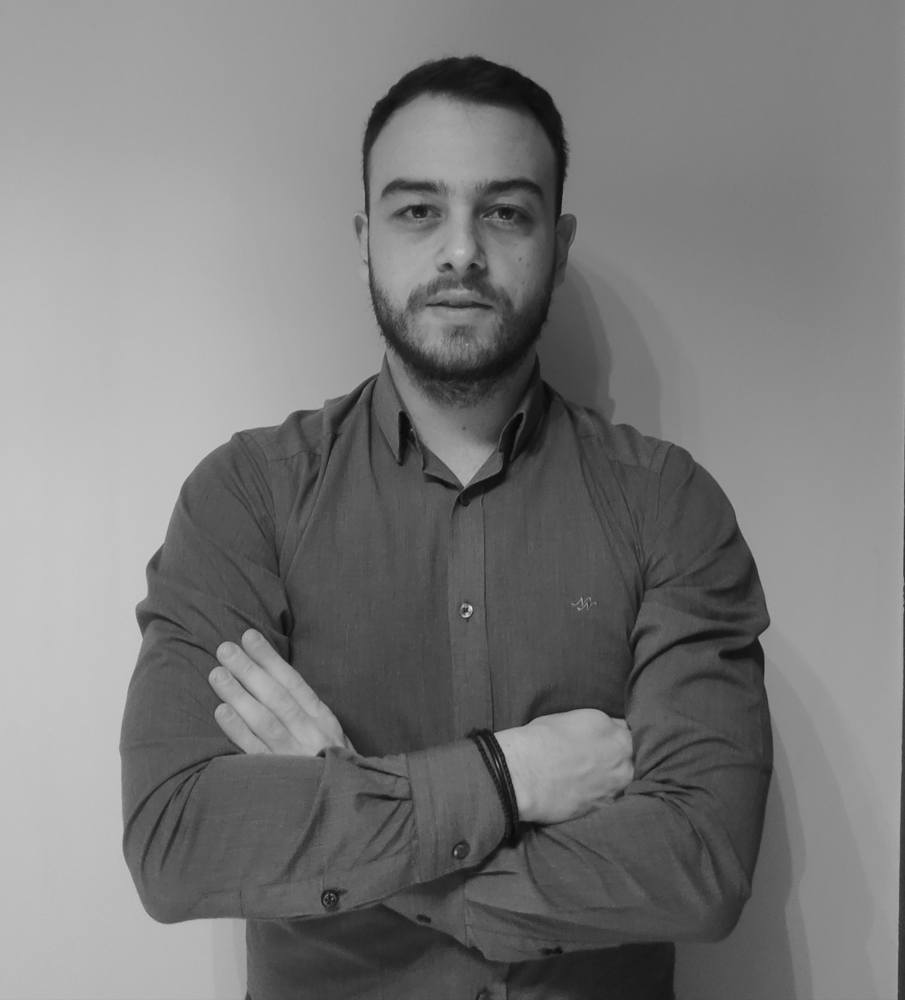

In [34]:
me1

In [35]:
me2

array([[[175, 156, 124],
        [175, 156, 124],
        [176, 157, 125],
        ...,
        [151, 126,  96],
        [151, 126,  96],
        [151, 126,  96]],

       [[177, 158, 126],
        [177, 158, 126],
        [177, 158, 126],
        ...,
        [153, 128,  98],
        [152, 127,  97],
        [152, 127,  97]],

       [[177, 158, 126],
        [176, 157, 125],
        [176, 157, 125],
        ...,
        [154, 129,  99],
        [155, 130, 100],
        [155, 130, 100]],

       ...,

       [[200, 185, 154],
        [200, 185, 154],
        [199, 184, 153],
        ...,
        [ 65,  48,  40],
        [ 64,  47,  39],
        [ 62,  45,  37]],

       [[201, 186, 157],
        [201, 186, 157],
        [200, 185, 156],
        ...,
        [ 65,  48,  41],
        [ 64,  47,  40],
        [ 62,  45,  38]],

       [[191, 176, 147],
        [192, 177, 148],
        [191, 176, 147],
        ...,
        [ 63,  46,  39],
        [ 59,  42,  35],
        [ 57,  40,  33]]

In [36]:
np.asarray(me1)

array([[158, 158, 159, ..., 130, 130, 130],
       [160, 160, 160, ..., 132, 131, 131],
       [160, 159, 159, ..., 133, 134, 134],
       ...,
       [186, 186, 185, ...,  52,  51,  49],
       [187, 187, 186, ...,  52,  51,  49],
       [177, 178, 177, ...,  50,  46,  44]], dtype=uint8)

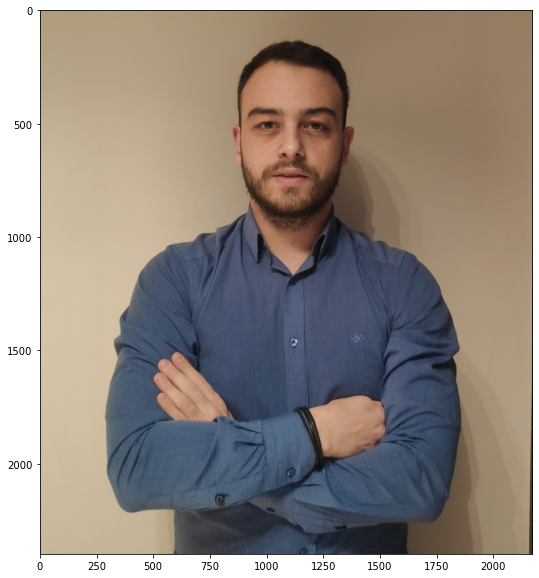

In [37]:
plt.figure(figsize=(20,10))
plt.imshow(np.asarray(me2), cmap='gray')
None

# Inverted Image

In [39]:
inverted_me  = cv2.bitwise_not(np.asarray(me1))

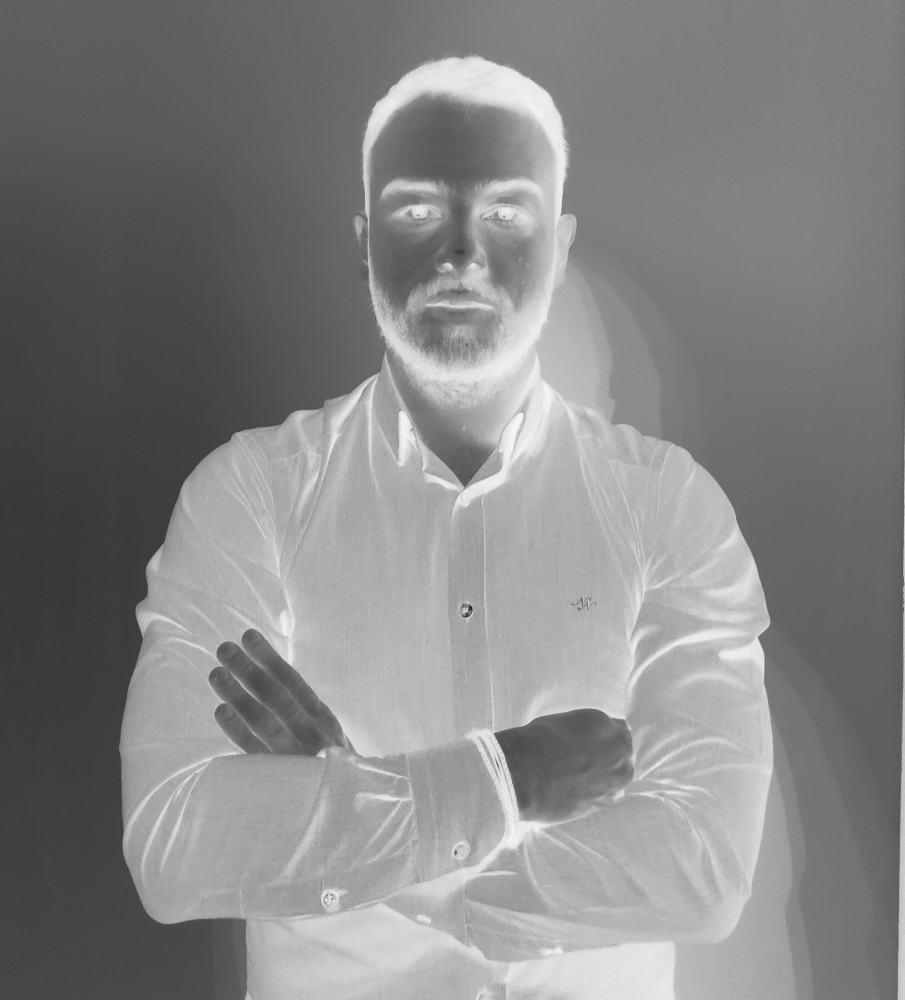

In [40]:
Image.fromarray(inverted_me)

In [42]:
inverted_me2  = cv2.bitwise_not(me2)

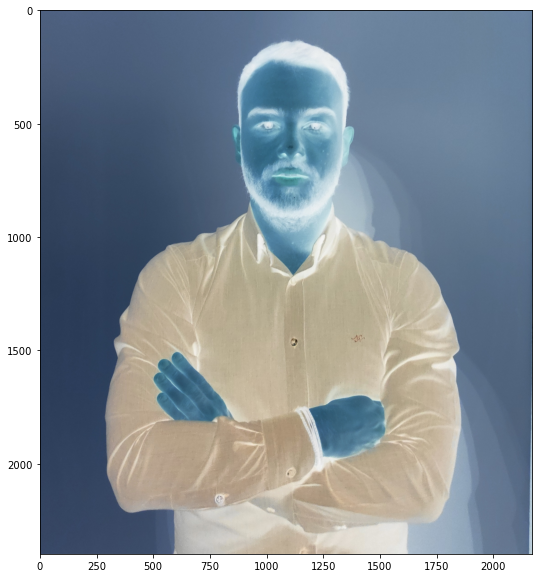

In [43]:
plt.figure(figsize=(20,10))
plt.imshow(inverted_me2, cmap='gray') # Inverted and gray scale
None

# Binarization

In [44]:
def greyscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [45]:
grey_me = greyscale(me2)

In [46]:
grey_me

array([[149, 149, 150, ..., 120, 120, 120],
       [151, 151, 151, ..., 122, 121, 121],
       [151, 150, 150, ..., 123, 124, 124],
       ...,
       [177, 177, 176, ...,  48,  47,  45],
       [179, 179, 178, ...,  48,  47,  45],
       [169, 170, 169, ...,  46,  42,  40]], dtype=uint8)

In [47]:
thresh, im_bw = cv2.threshold(grey_me, 100, 100, cv2.THRESH_BINARY)

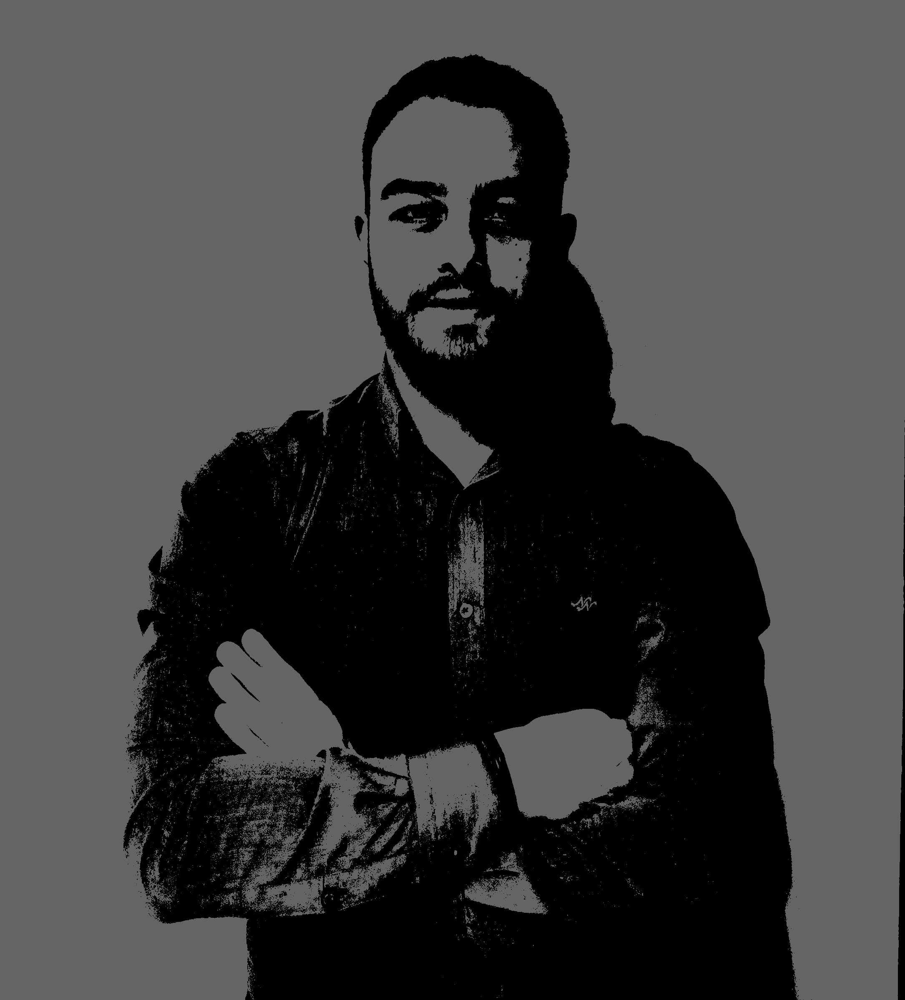

In [48]:
Image.fromarray(im_bw)

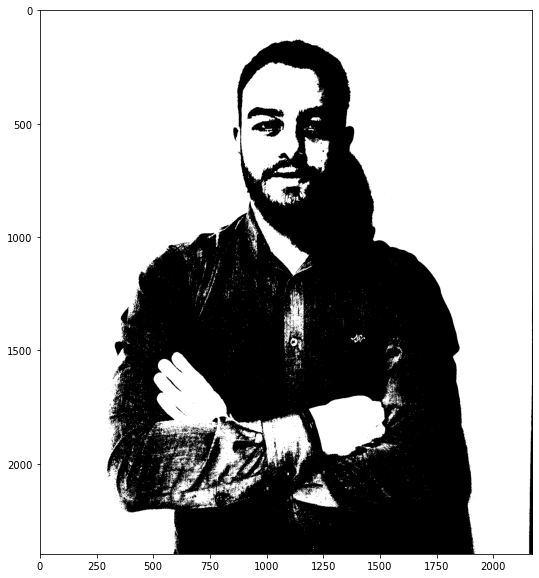

In [49]:
plt.figure(figsize=(20,10))
plt.imshow(im_bw, cmap="gray")
None

# Noise Removal

In [50]:
def noise_removal(image):
    kernel = np.ones((1,1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernel = np.ones((1,1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return image

In [51]:
no_noise = noise_removal(im_bw)

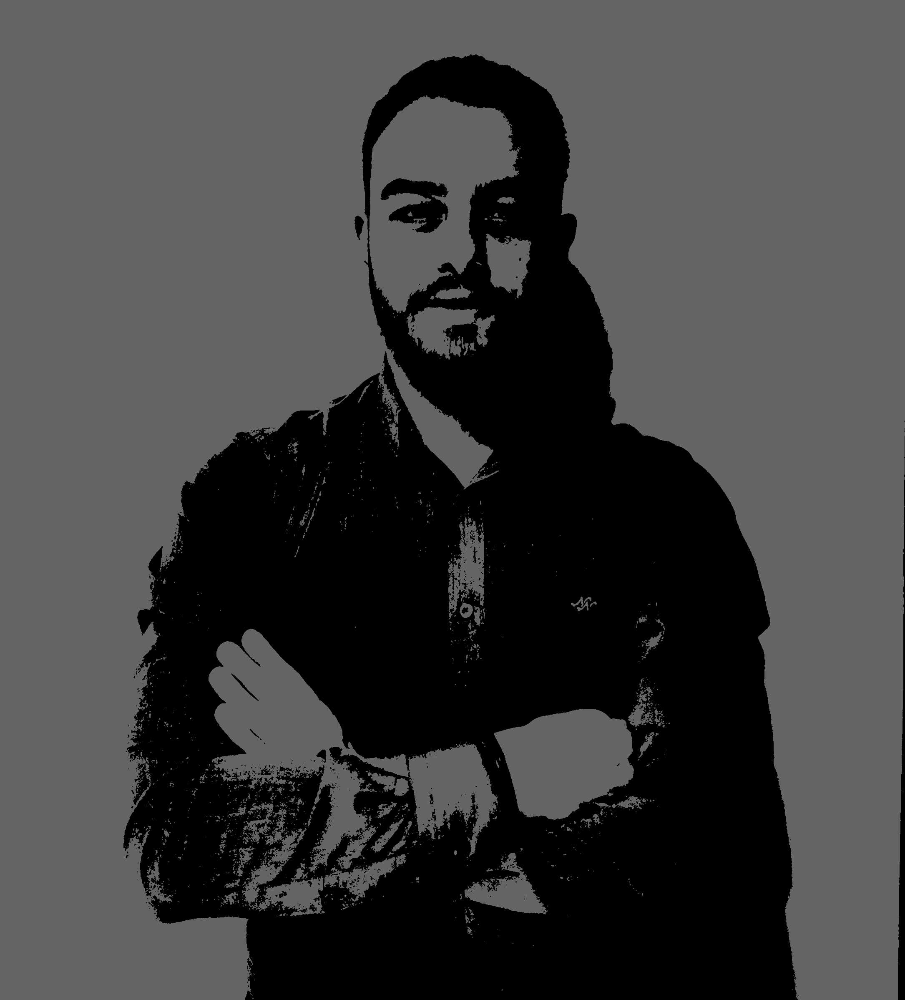

In [52]:
Image.fromarray(no_noise) # Not good result no need for de noising

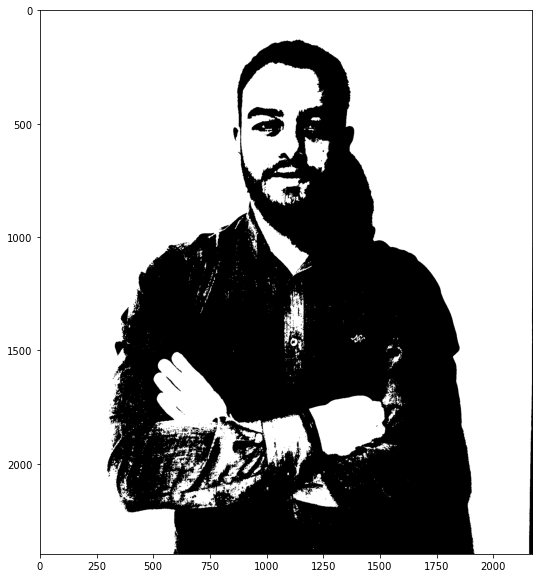

In [53]:
plt.figure(figsize=(20,10))
plt.imshow(no_noise, cmap="gray")
None

# Rotation / Deskewing

In [26]:
#https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
import numpy as np

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

In [27]:
# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [55]:
fixed_me = deskew(np.asarray(me2))

30


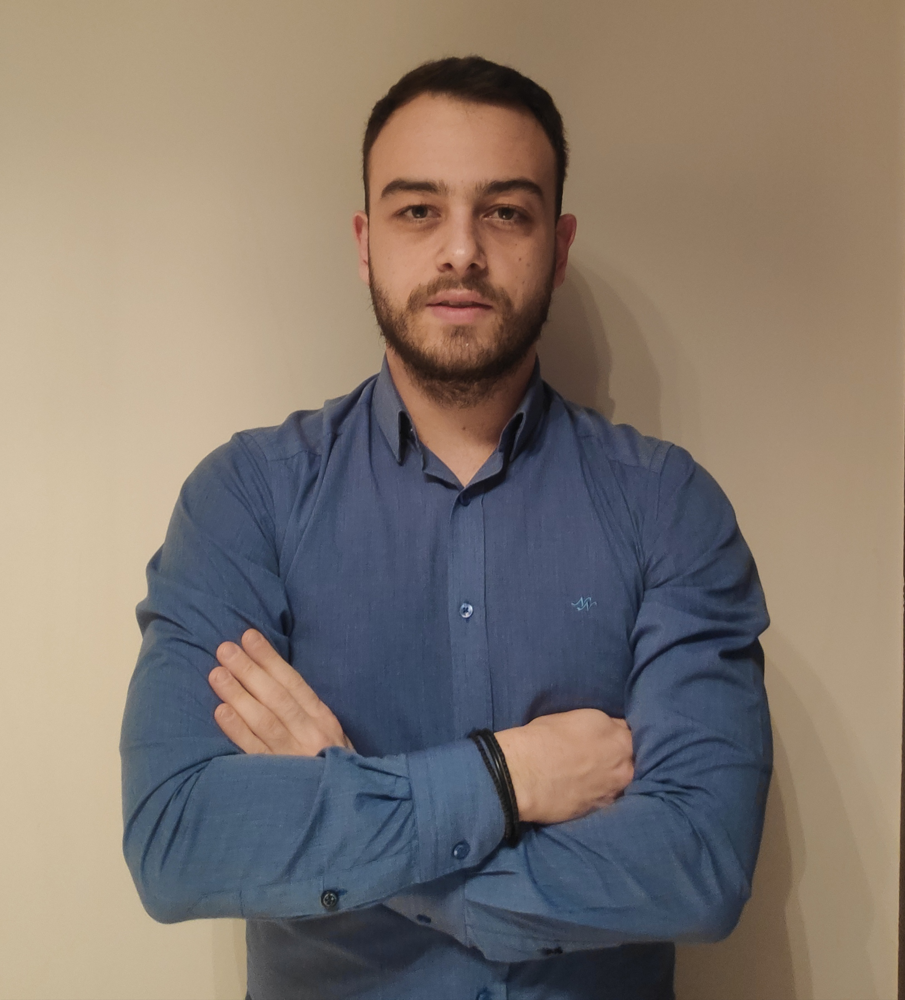

In [56]:
Image.fromarray(fixed_me) # the photo was not rotated that's it is not working well

In [59]:
me2.shape # three color channels RGB 

(2397, 2170, 3)

In [60]:
me2 = me2/255.0

In [22]:
invoice

array([[[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       ...,

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]],

       [[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        ...,
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]]])

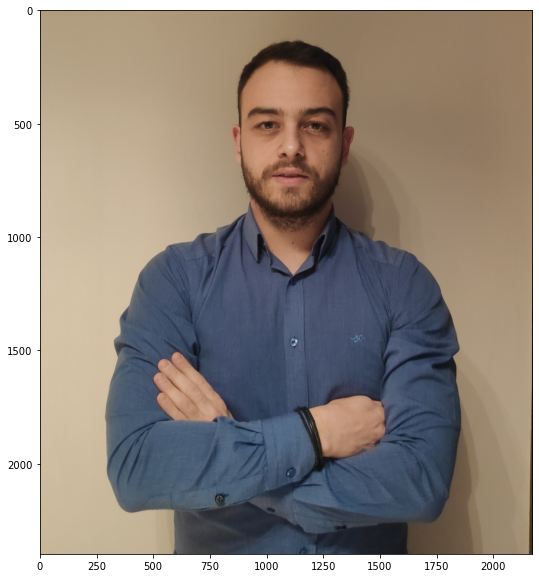

In [61]:
plt.figure(figsize=(20,10))
plt.imshow(me2)
None

# Segmentation

In [151]:
me = Image.open("data\me\IMG_20211118_171323.jpg")

In [152]:
type(me)

PIL.JpegImagePlugin.JpegImageFile

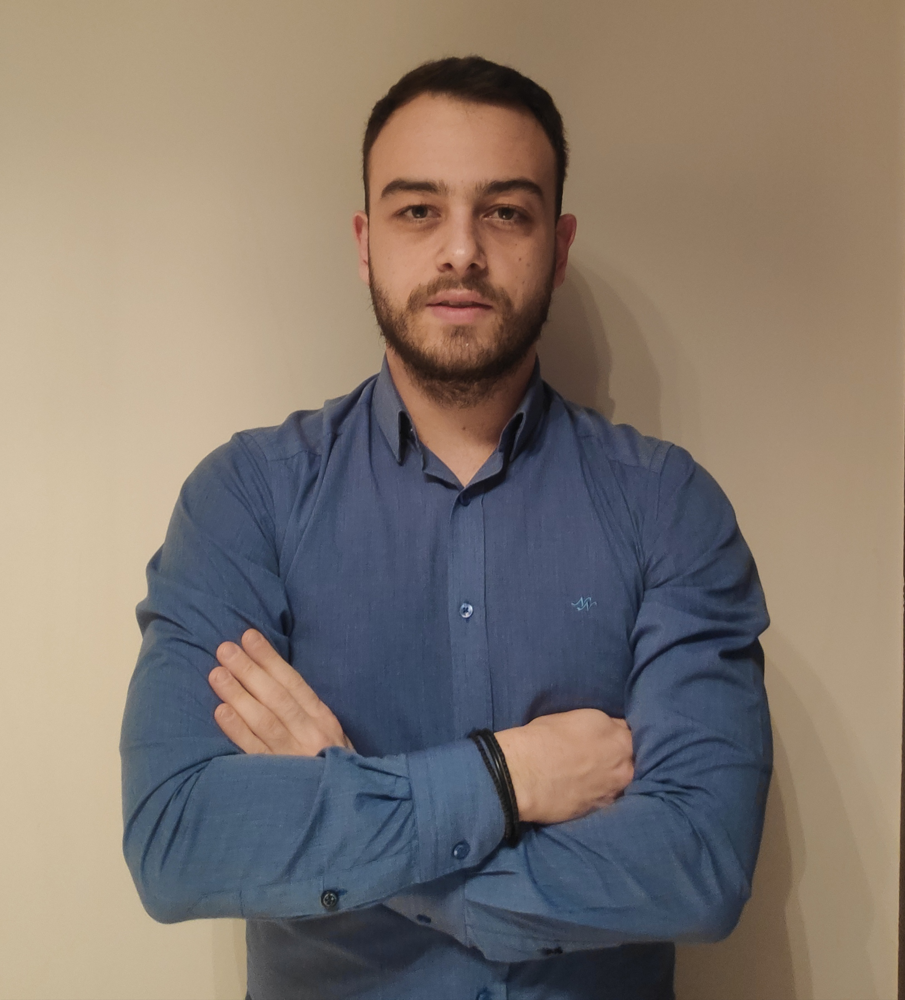

In [153]:
me

In [154]:
me_array_scaled = np.asarray(me)/255.0 # Scale image

In [155]:
me_array_scaled # See the results

array([[[0.68627451, 0.61176471, 0.48627451],
        [0.68627451, 0.61176471, 0.48627451],
        [0.69019608, 0.61568627, 0.49019608],
        ...,
        [0.59215686, 0.49411765, 0.37647059],
        [0.59215686, 0.49411765, 0.37647059],
        [0.59215686, 0.49411765, 0.37647059]],

       [[0.69411765, 0.61960784, 0.49411765],
        [0.69411765, 0.61960784, 0.49411765],
        [0.69411765, 0.61960784, 0.49411765],
        ...,
        [0.6       , 0.50196078, 0.38431373],
        [0.59607843, 0.49803922, 0.38039216],
        [0.59607843, 0.49803922, 0.38039216]],

       [[0.69411765, 0.61960784, 0.49411765],
        [0.69019608, 0.61568627, 0.49019608],
        [0.69019608, 0.61568627, 0.49019608],
        ...,
        [0.60392157, 0.50588235, 0.38823529],
        [0.60784314, 0.50980392, 0.39215686],
        [0.60784314, 0.50980392, 0.39215686]],

       ...,

       [[0.78431373, 0.7254902 , 0.60392157],
        [0.78431373, 0.7254902 , 0.60392157],
        [0.78039216, 0

In [156]:
me_array_scaled.shape

(2397, 2170, 3)

In [157]:
X = me_array_scaled.reshape(-1,3) # Reduct to 2 dimensions

In [158]:
X

array([[0.68627451, 0.61176471, 0.48627451],
       [0.68627451, 0.61176471, 0.48627451],
       [0.69019608, 0.61568627, 0.49019608],
       ...,
       [0.24705882, 0.18039216, 0.15294118],
       [0.23137255, 0.16470588, 0.1372549 ],
       [0.22352941, 0.15686275, 0.12941176]])

In [159]:
X.shape

(5201490, 3)

In [160]:
from sklearn.cluster import KMeans

In [161]:
km =KMeans(n_clusters=2) # Clustering with two clusters
km.fit(X)

KMeans(n_clusters=2)

In [162]:
km.labels_ # print the labels 

array([0, 0, 0, ..., 1, 1, 1])

In [163]:
km.labels_.shape # print the shape of the labels

(5201490,)

In [164]:
img_seg_centers = km.cluster_centers_

In [165]:
img_seg_centers # Print the centers of the clusters

array([[0.6871866 , 0.59704822, 0.49365917],
       [0.26643086, 0.28832207, 0.34778202]])

In [166]:
img_seg = img_seg_centers[km.labels_]

In [167]:
img_seg # Replace the pixel with the cluster center that it belongs

array([[0.6871866 , 0.59704822, 0.49365917],
       [0.6871866 , 0.59704822, 0.49365917],
       [0.6871866 , 0.59704822, 0.49365917],
       ...,
       [0.26643086, 0.28832207, 0.34778202],
       [0.26643086, 0.28832207, 0.34778202],
       [0.26643086, 0.28832207, 0.34778202]])

In [168]:
img_seg.shape

(5201490, 3)

In [169]:
km.labels_.reshape(img_seg.shape[0], 1) # Reshape the clusters labels

array([[0],
       [0],
       [0],
       ...,
       [1],
       [1],
       [1]])

In [170]:
km.labels_.reshape(img_seg.shape[0], 1).shape # check the shape

(5201490, 1)

In [171]:
# Append the the labels to the array 
img_seg = np.append(img_seg, km.labels_.reshape(img_seg.shape[0], 1), axis=1) 

In [172]:
img_seg # New array

array([[0.6871866 , 0.59704822, 0.49365917, 0.        ],
       [0.6871866 , 0.59704822, 0.49365917, 0.        ],
       [0.6871866 , 0.59704822, 0.49365917, 0.        ],
       ...,
       [0.26643086, 0.28832207, 0.34778202, 1.        ],
       [0.26643086, 0.28832207, 0.34778202, 1.        ],
       [0.26643086, 0.28832207, 0.34778202, 1.        ]])

In [173]:
img_seg[0][3]

0.0

In [174]:
for row in img_seg: # Replace cluster with label 0 with 0 values
    if row[3] == 0:
        row[0] = 0
        row[1] = 0
        row[2] = 0

In [175]:
img_seg

array([[0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        ],
       ...,
       [0.26643086, 0.28832207, 0.34778202, 1.        ],
       [0.26643086, 0.28832207, 0.34778202, 1.        ],
       [0.26643086, 0.28832207, 0.34778202, 1.        ]])

In [176]:
img_seg[:,:-1]

array([[0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       ...,
       [0.26643086, 0.28832207, 0.34778202],
       [0.26643086, 0.28832207, 0.34778202],
       [0.26643086, 0.28832207, 0.34778202]])

In [177]:
img_seg = img_seg[:,:-1].reshape(me_array_scaled.shape) # Exclude the clusters

In [178]:
img_seg = img_seg.reshape(me_array_scaled.shape) # Reshape to initial shape

In [179]:
img_seg

array([[[0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ]],

       [[0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ]],

       [[0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ]],

       ...,

       [[0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0

In [180]:
img_seg.shape

(2397, 2170, 3)

In [181]:
img_seg[0][0]

array([0., 0., 0.])

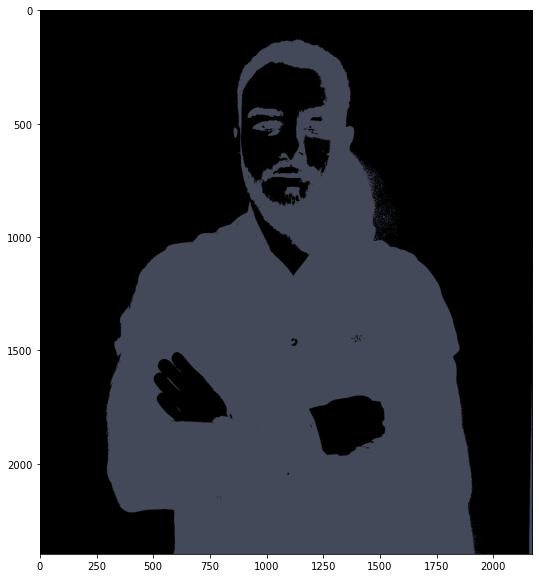

In [182]:
plt.figure(figsize=(20,10))
plt.imshow(img_seg)
None